In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor as GBR
from sklearn.model_selection import cross_validate
from sklearn.model_selection import validation_curve
from sklearn.model_selection import learning_curve
from sklearn.metrics import r2_score

In [2]:
from google.colab import drive
drive.mount('/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive


In [0]:
train_values = pd.read_csv('/gdrive/My Drive/Datasets/train_values_OL27nta.csv')
train_labels = pd.read_csv('/gdrive/My Drive/Datasets/train_labels_DPetPH2.csv')

# Exploratory Data Analysis

In [0]:
features = train_values.drop('row_id',axis=1)

In [0]:
features.describe()

,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k
count,1.562000e+03,1.562000e+03,1562.000000,1235.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1560.000000,1560.000000,1560.000000,1344.000000,1560.000000,1446.000000,1100.000000,1560.000000,1542.000000,613.000000,1372.000000,1562.000000,1447.000000,1448.000000,1560.000000,1560.000000,1560.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000,1562.000000
mean,1.083407e+05,1.490462e+04,28.525570,397.410526,28.537526,0.769045,0.088593,0.092012,0.018431,0.012709,0.000711,0.017583,0.000916,12.182780,0.470535,0.062551,0.220037,0.088844,0.304546,0.211682,0.106566,0.083326,0.164818,0.276981,11.637336,5.752414,21.715153,275.482714,3421.828611,2508.303867,0.499388,0.228672,0.167707,0.145666,0.346271,0.303030,0.205033,11.621356,10.415138
std,3.745229e+05,6.255947e+04,8.121601,1522.801074,4.670467,0.203306,0.143505,0.141599,0.074762,0.026693,0.003059,0.015836,0.001657,5.783889,0.070936,0.022615,0.067500,0.041480,0.043550,0.064045,0.022521,0.021239,0.051483,0.053098,1.534144,4.297808,10.721369,57.827540,2538.670834,1960.312344,0.023933,0.034732,0.044555,0.067483,0.071152,0.052236,0.092001,2.756009,2.772070
min,2.690000e+02,6.400000e+01,7.279000,-1.000000,9.909000,0.009547,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.186000,0.012000,0.053000,0.018000,0.133000,0.031000,0.033000,0.030000,0.032000,0.104000,7.209413,-0.080000,3.140000,76.000000,340.000000,279.000000,0.314000,0.082000,0.036000,0.019000,0.074297,0.114458,0.064128,3.654080,0.961076
25%,1.045275e+04,1.078250e+03,22.874000,3.000000,25.869000,0.649967,0.005523,0.018747,0.001201,0.002391,0.000000,0.009465,0.000000,7.991000,0.425000,0.046000,0.171750,0.059000,0.283000,0.169000,0.092000,0.070000,0.129000,0.243000,10.432910,2.710000,14.047500,233.000000,1859.000000,1389.750000,0.495000,0.208000,0.140000,0.094226,0.300601,0.269461,0.142142,10.014818,8.613691
50%,2.528200e+04,2.754000e+03,27.199500,27.000000,28.768000,0.846542,0.020599,0.037613,0.002610,0.005279,0.000000,0.014438,0.000302,11.173500,0.470500,0.061000,0.216000,0.079000,0.306000,0.206000,0.105000,0.080000,0.163000,0.281000,11.907300,4.540000,20.285000,270.000000,2730.000000,1969.500000,0.504000,0.227000,0.164000,0.129388,0.352176,0.303303,0.182365,11.435441,10.396898
75%,6.836150e+04,7.987000e+03,32.341500,162.500000,31.307250,0.933479,0.102047,0.092998,0.006121,0.011886,0.000403,0.020999,0.001197,15.018500,0.515000,0.076000,0.265000,0.109000,0.331250,0.249000,0.122000,0.091000,0.196000,0.312000,12.885680,7.600000,27.072500,311.000000,4064.500000,2840.000000,0.511000,0.246000,0.191000,0.187719,0.396556,0.337672,0.241234,12.940235,12.250655
max,1.002029e+07,1.760277e+06,73.008000,29251.000000,49.665000,0.995141,0.756011,0.987039,0.815817,0.418088,0.085037,0.184332,0.019582,38.792000,0.996000,0.242000,0.520000,0.327000,0.474000,0.513000,0.180000,0.182000,0.419000,0.446000,14.992477,26.920000,110.450000,511.000000,25169.000000,16740.000000,0.564000,0.415000,0.488000,0.535750,0.535536,0.477341,0.788153,29.034900,24.281150


In [0]:
target = train_labels.drop('row_id', axis=1)

In [0]:
target.describe()

,gross_rent
count,1562.000000
mean,701.142125
std,192.883110
min,351.000000
25%,578.000000
50%,650.000000
75%,773.750000
max,1827.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9b06b43278>]],
      dtype=object)

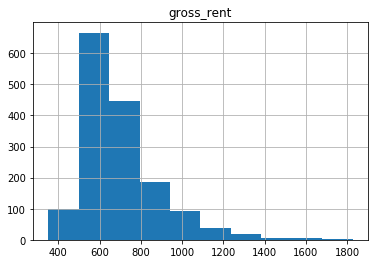

In [0]:
target.hist()

In [0]:
categorical = train_values.dtypes == object
categorical_cols = [i for i in categorical.index if categorical[i]]
categorical_cols

['county_code', 'state', 'rucc', 'urban_influence', 'economic_typology']

In [0]:
def making_bar_graph(features,column):
    dat = pd.DataFrame(features[column].value_counts())
    y = list(dat[column][:])
    x = list(dat.index)
    dictionary = {}
    for i in range(1,len(x)+1):
        dictionary[i] = y[i-1]
    #print(x)
    plt.rcParams['figure.figsize']= [18,18]
    plt.bar(range(1,len(x)+1),y)
    legends = [str(i)+" "+x[i-1]+"\n" for i in range(1,len(x)+1)]
    plt.xticks(range(1,len(x)+1))
    plt.title("Bar graph of the feature "+ column)
    plt.show()
    print(''.join(legends))
    return None

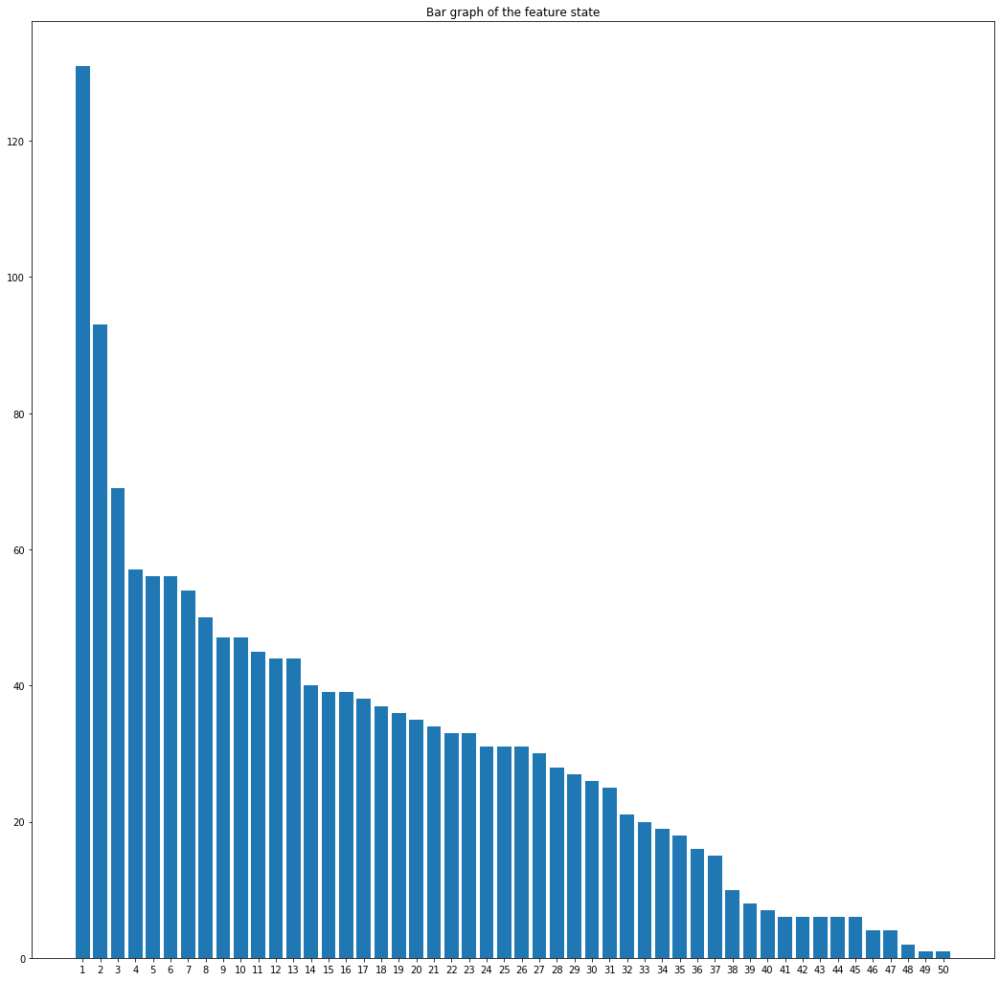

1 1b0d913
2 4522abc
3 a952566
4 528ea9f
5 c479f0c
6 20d32fc
7 08f8fb4
8 dc9ae72
9 09d8cd0
10 9d1e27d
11 b795815
12 0f8930b
13 e2f94fa
14 7572db1
15 9d0874a
16 9dda412
17 158df01
18 1dcfd4e
19 e74aca3
20 8036085
21 c3dbf0a
22 78e8330
23 9e0007d
24 4c72956
25 52acab4
26 e899d7f
27 fb8cab1
28 5086a32
29 1646cf6
30 842bd12
31 485e9af
32 698ab34
33 4cd9667
34 3745933
35 7dd3518
36 176f5f0
37 64ffe5d
38 d233cec
39 5029ed4
40 bc77872
41 fa605d5
42 b44cfe6
43 2b7da97
44 3337bbb
45 dfc21f3
46 6d287d7
47 105e445
48 375d4d3
49 9e065a4
50 914c15f



In [0]:
making_bar_graph(features,categorical_cols[1])

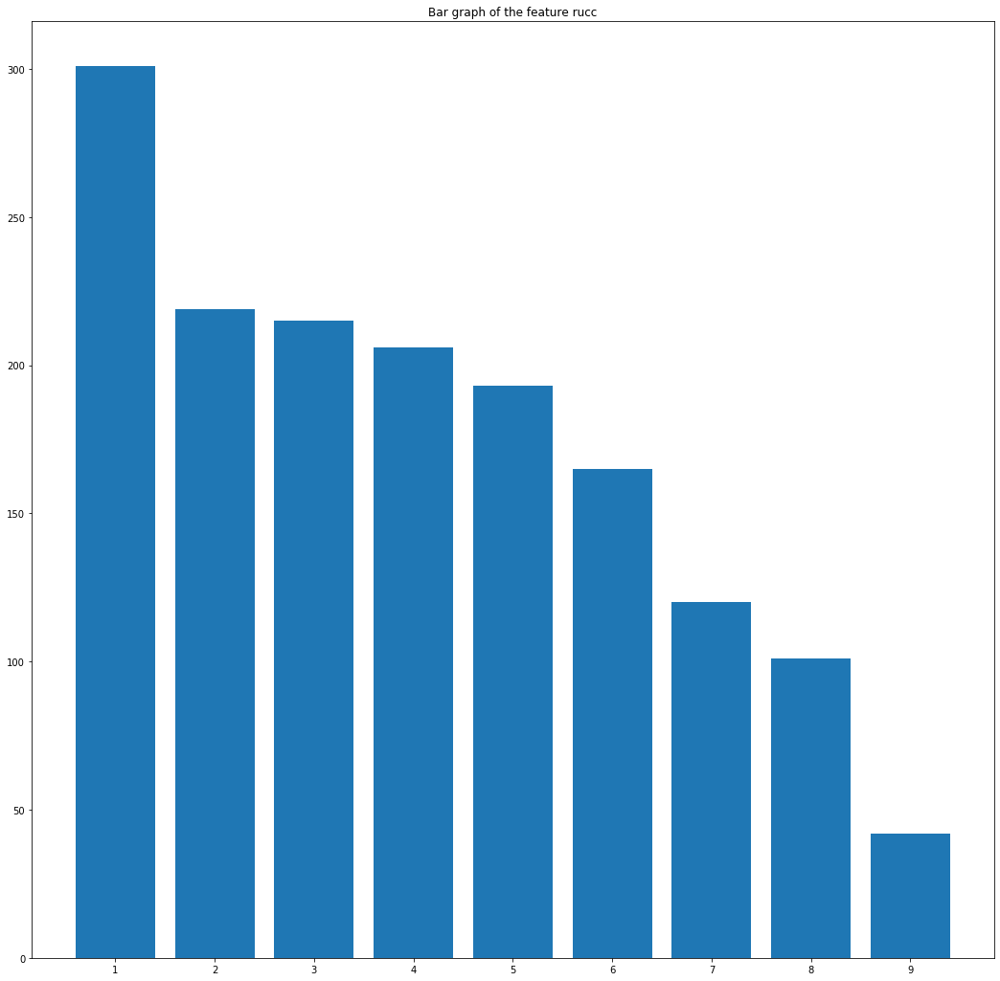

1 Nonmetro - Urban population of 2,500 to 19,999, adjacent to a metro area
2 Metro - Counties in metro areas of 1 million population or more
3 Nonmetro - Completely rural or less than 2,500 urban population, not adjacent to a metro area
4 Nonmetro - Urban population of 2,500 to 19,999, not adjacent to a metro area
5 Metro - Counties in metro areas of 250,000 to 1 million population
6 Metro - Counties in metro areas of fewer than 250,000 population
7 Nonmetro - Completely rural or less than 2,500 urban population, adjacent to a metro area
8 Nonmetro - Urban population of 20,000 or more, adjacent to a metro area
9 Nonmetro - Urban population of 20,000 or more, not adjacent to a metro area



In [0]:
making_bar_graph(features,categorical_cols[2])

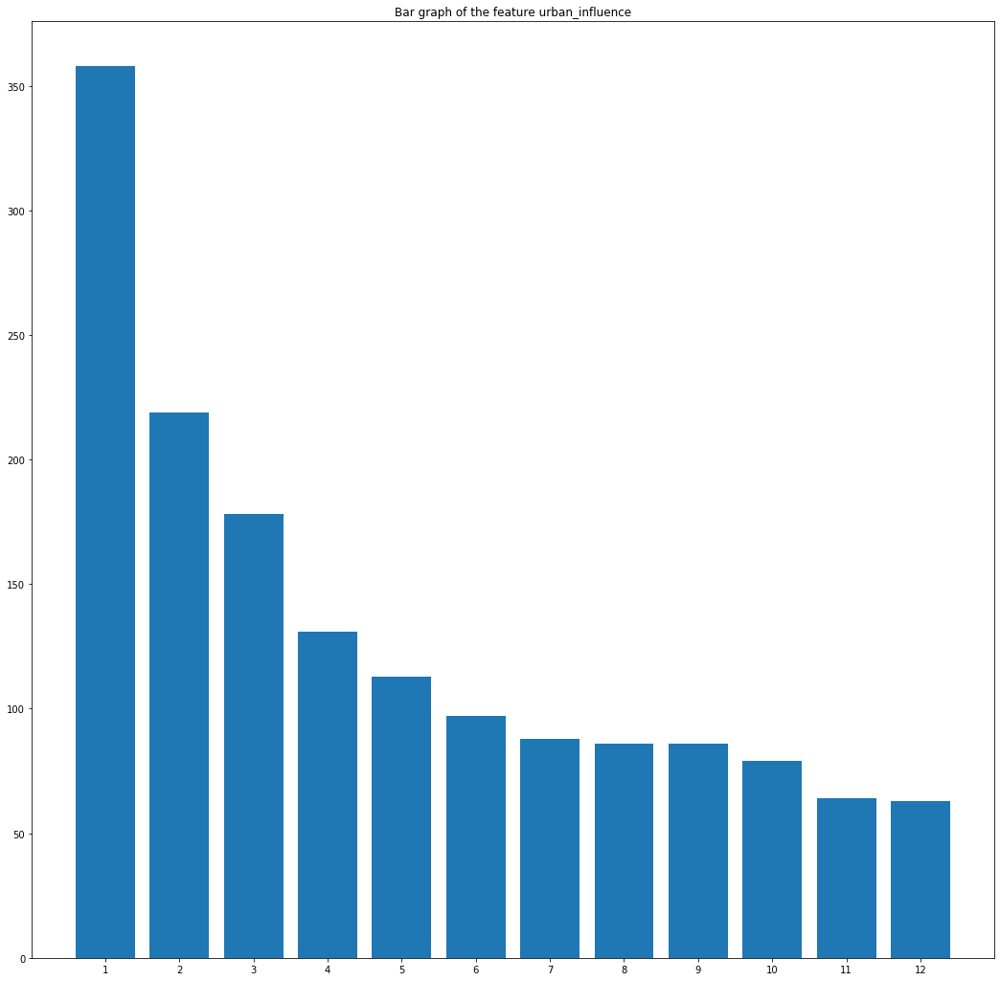

1 Small-in a metro area with fewer than 1 million residents
2 Large-in a metro area with at least 1 million residents or more
3 Noncore adjacent to a small metro with town of at least 2,500 residents
4 Micropolitan not adjacent to a metro area
5 Micropolitan adjacent to a small metro area
6 Noncore adjacent to micro area and does not contain a town of at least 2,500 residents
7 Noncore adjacent to a small metro and does not contain a town of at least 2,500 residents
8 Noncore adjacent to micro area and contains a town of 2,500-19,999 residents
9 Noncore not adjacent to a metro/micro area and does not contain a town of at least 2,500 residents
10 Noncore adjacent to a large metro area
11 Micropolitan adjacent to a large metro area
12 Noncore not adjacent to a metro/micro area and contains a town of 2,500  or more residents



In [0]:
making_bar_graph(features,categorical_cols[3])

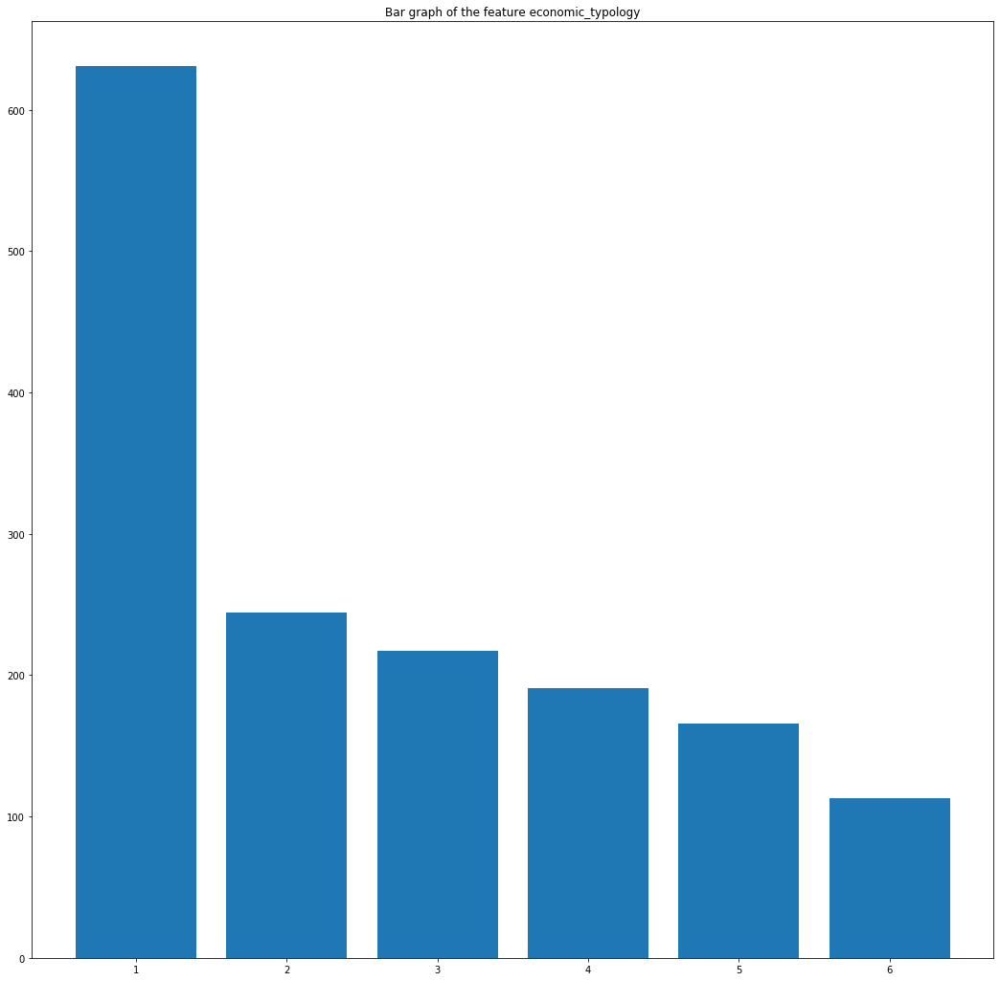

1 Nonspecialized
2 Manufacturing-dependent
3 Farm-dependent
4 Federal/State government-dependent
5 Recreation
6 Mining-dependent



In [0]:
making_bar_graph(features,categorical_cols[4])

In [0]:
numerical = (features.dtypes == float) | (features.dtypes == int)
numerical_columns = [i for i in numerical.index if numerical[i]]

In [0]:
numerical_columns_and_target = pd.concat([features[numerical_columns],target],axis=1)

In [0]:
sns.pairplot(numerical_columns_and_target)

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


In [0]:
numerical_columns_and_target.corr()

,population,renter_occupied_households,pct_renter_occupied,evictions,rent_burden,pct_white,pct_af_am,pct_hispanic,pct_am_ind,pct_asian,pct_nh_pi,pct_multiple,pct_other,poverty_rate,pct_civilian_labor,pct_unemployment,pct_uninsured_adults,pct_uninsured_children,pct_adult_obesity,pct_adult_smoking,pct_diabetes,pct_low_birthweight,pct_excessive_drinking,pct_physical_inactivity,air_pollution_particulate_matter_value,homicides_per_100k,motor_vehicle_crash_deaths_per_100k,heart_disease_mortality_per_100k,pop_per_dentist,pop_per_primary_care_physician,pct_female,pct_below_18_years_of_age,pct_aged_65_years_and_older,pct_adults_less_than_a_high_school_diploma,pct_adults_with_high_school_diploma,pct_adults_with_some_college,pct_adults_bachelors_or_higher,birth_rate_per_1k,death_rate_per_1k,gross_rent
population,1.000000,0.979015,0.285874,0.800173,0.162747,-0.233149,0.065498,0.194042,-0.047605,0.459903,0.086141,0.074529,0.219683,-0.029601,0.074573,0.004028,0.000057,-0.059270,-0.217103,-0.195657,-0.172038,-0.029178,-0.000721,-0.240345,-0.102763,-0.026795,-0.269513,-0.133897,-0.166771,-0.134868,0.102691,0.067631,-0.202828,-0.029638,-0.303886,-0.068912,0.295888,0.099957,-0.252709,0.398343
renter_occupied_households,0.979015,1.000000,0.320175,0.790723,0.146213,-0.227568,0.076058,0.176860,-0.040348,0.435849,0.076874,0.069009,0.218633,-0.002518,0.065894,0.009995,0.014840,-0.047528,-0.197820,-0.172043,-0.150268,-0.013490,-0.004593,-0.206235,-0.101503,0.018712,-0.237650,-0.112827,-0.149875,-0.121639,0.092542,0.040795,-0.182385,-0.011385,-0.271734,-0.075980,0.261647,0.099201,-0.221893,0.345154
pct_renter_occupied,0.285874,0.320175,1.000000,0.357836,0.229203,-0.472168,0.283012,0.211543,0.140909,0.407788,0.172797,0.195395,0.231417,0.311045,-0.009933,0.123263,0.182252,0.011460,-0.052990,-0.076117,-0.134396,0.159542,-0.056945,-0.154324,-0.052468,0.230084,-0.239387,0.030945,-0.246900,-0.243364,0.026768,0.110950,-0.457286,0.103800,-0.372389,-0.076354,0.255215,0.319060,-0.320552,0.278613
evictions,0.800173,0.790723,0.357836,1.000000,0.147673,-0.286329,0.187811,0.146569,-0.036577,0.390145,0.025700,0.080335,0.204129,0.026839,0.082754,0.010476,0.046369,-0.041610,-0.121492,-0.148882,-0.121295,0.056684,-0.016261,-0.180947,-0.051053,0.154634,-0.264938,-0.089318,-0.168579,-0.135237,0.129837,0.093737,-0.253480,-0.033288,-0.296329,-0.051397,0.290274,0.163688,-0.253198,0.325653
rent_burden,0.162747,0.146213,0.229203,0.147673,1.000000,-0.192858,0.336120,-0.015368,-0.144384,0.127979,-0.006853,0.018550,0.154167,0.387541,-0.367540,0.429351,0.059280,-0.211067,-0.008044,0.079550,0.144635,0.296222,-0.226291,-0.129765,0.122957,0.220348,-0.163302,0.124221,-0.021947,-0.011258,0.175525,-0.180764,-0.116121,0.146306,-0.166862,-0.170873,0.118751,-0.116683,-0.056973,0.237213
pct_white,-0.233149,-0.227568,-0.472168,-0.286329,-0.192858,1.000000,-0.583318,-0.616874,-0.298028,-0.283322,-0.134611,-0.107596,-0.173874,-0.507542,0.273989,-0.318836,-0.541874,-0.296796,-0.124158,0.029628,-0.127659,-0.450258,0.143628,0.017409,0.206009,-0.566118,-0.078675,-0.129243,-0.042792,-0.012197,0.087588,-0.339290,0.414822,-0.496270,0.297398,0.194806,0.023405,-0.385159,0.276071,-0.226985
pct_af_am,0.065498,0.076058,0.283012,0.187811,0.336120,-0.583318,1.000000,-0.112171,-0.106352,0.024738,-0.063326,-0.109740,0.115787,0.499824,-0.355941,0.400824,0.202526,-0.080939,0.412122,0.030566,0.499317,0.702009,-0.284449,0.256720,0.184202,0.723656,0.106245,0.390890,0.139159,0.115274,0.104425,0.027910,-0.206035,0.354774,-0.017912,-0.263132,-0.096975,0.062403,0.019817,0.016147
pct_hispanic,0.194042,0.176860,0.211543,0.146569,-0.015368,-0.616874,-0.112171,1.000000,-0.036295,0.134626,0.033474,-0.075541,0.076177,0.140752,-0.014961,-0.039633,0.477658,0.427757,-0.244154,-0.185019,-0.256140,0.002001,-0.043534,-0.231922,-0.394491,-0.043708,-0.043327,-0.142515,0.008942,-0.043484,-0.152457,0.311977,-0.217716,0.409152,-0.328434,-0.072550,-0.004915,0.313438,-0.267824,0.170457
pct_am_ind,-0.047605,-0.040348,0.140909,-0.036577,

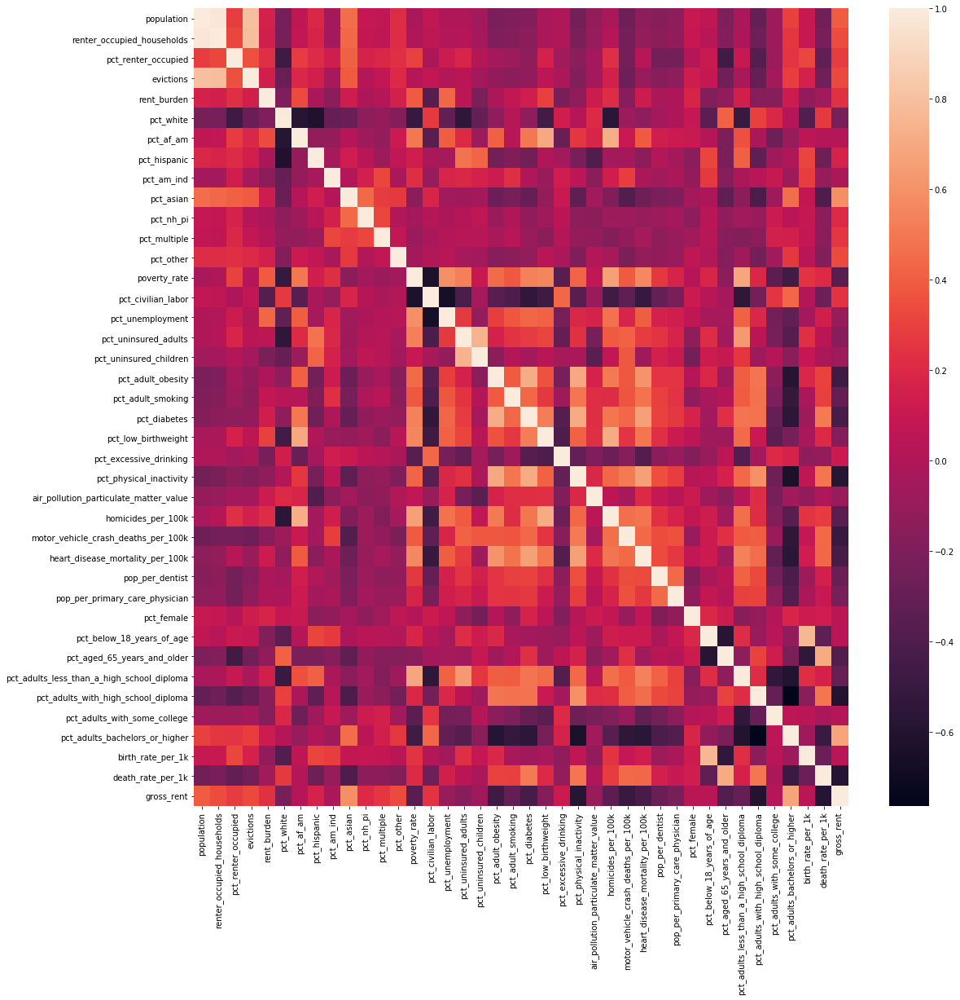

In [0]:
sns.heatmap(numerical_columns_and_target.corr())

In [0]:
categorical_columns_and_target = pd.concat([features[categorical_cols],target],axis = 1)

In [0]:
def generating_boxplot(datasource, categorical_column_name, target_name):

    data_needed = datasource[[categorical_column_name,target_name]]
    data_factorized = pd.DataFrame()
    data_factorized['Factor'] = pd.factorize(datasource[categorical_column_name])[0]
    data_concatenated = pd.concat([data_needed,data_factorized], axis=1)
    sns.boxplot(x=data_concatenated['Factor'],y=data_concatenated[target_name])
    plt.show()
    saving_the_factorizing = pd.Series(pd.factorize(datasource[categorical_column_name])[0])
    place_holder_1 = pd.DataFrame()
    place_holder_2 = pd.DataFrame()
    place_holder_1[categorical_column_name] = list(saving_the_factorizing.value_counts())
    place_holder_1['Factor'] = list(saving_the_factorizing.value_counts().index)
    place_holder_2[categorical_column_name] = list(datasource[categorical_column_name].value_counts())
    place_holder_2['Legend'] = list(datasource[categorical_column_name].value_counts().index)
    legend_dataframe = pd.concat([place_holder_1,place_holder_2],axis=1)
    legend_dataframe = legend_dataframe[['Factor','Legend']]

    return legend_dataframe

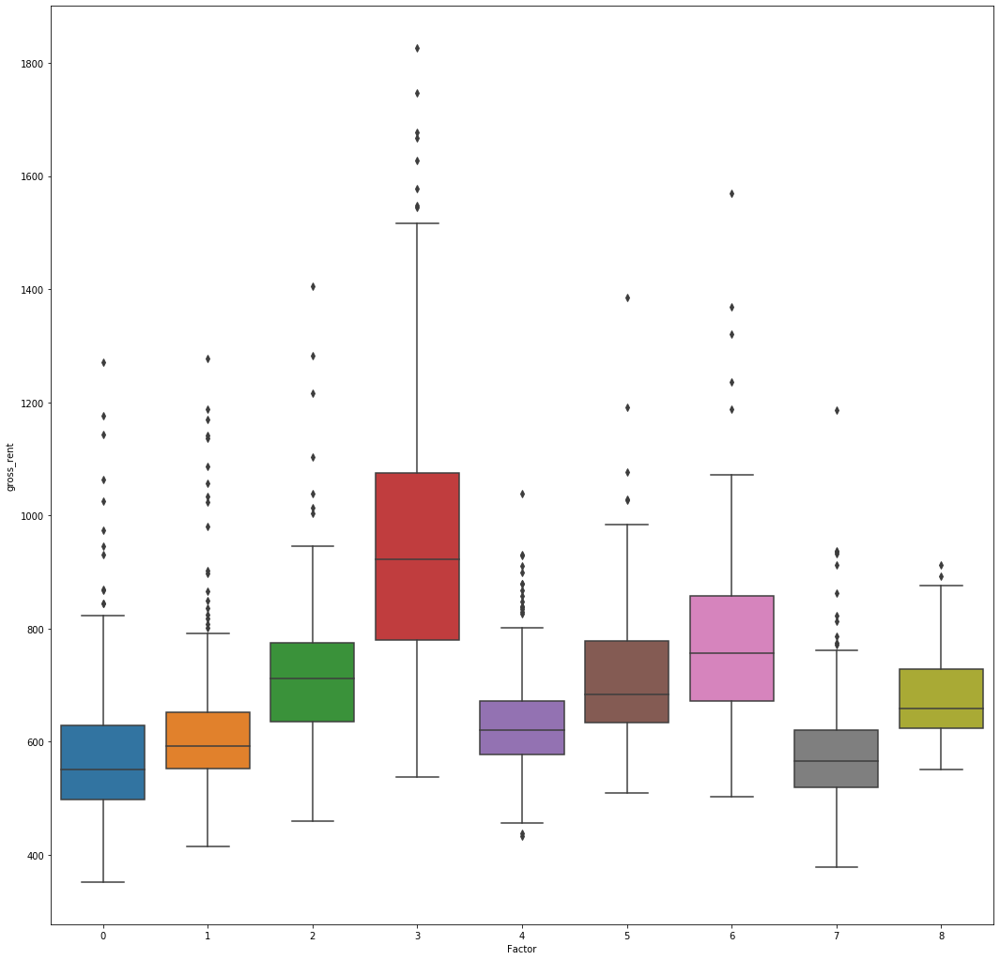

,Factor,Legend
0,4,"Nonmetro - Urban population of 2,500 to 19,999..."
1,3,Metro - Counties in metro areas of 1 million p...
2,0,"Nonmetro - Completely rural or less than 2,500..."
3,1,"Nonmetro - Urban population of 2,500 to 19,999..."
4,6,"Metro - Counties in metro areas of 250,000 to ..."
5,2,Metro - Counties in metro areas of fewer than ...
6,7,"Nonmetro - Completely rural or less than 2,500..."
7,5,"Nonmetro - Urban population of 20,000 or more,..."
8,8,"Nonmetro - Urban population of 20,000 or more,..."


In [0]:
generating_boxplot(categorical_columns_and_target,'rucc','gross_rent')

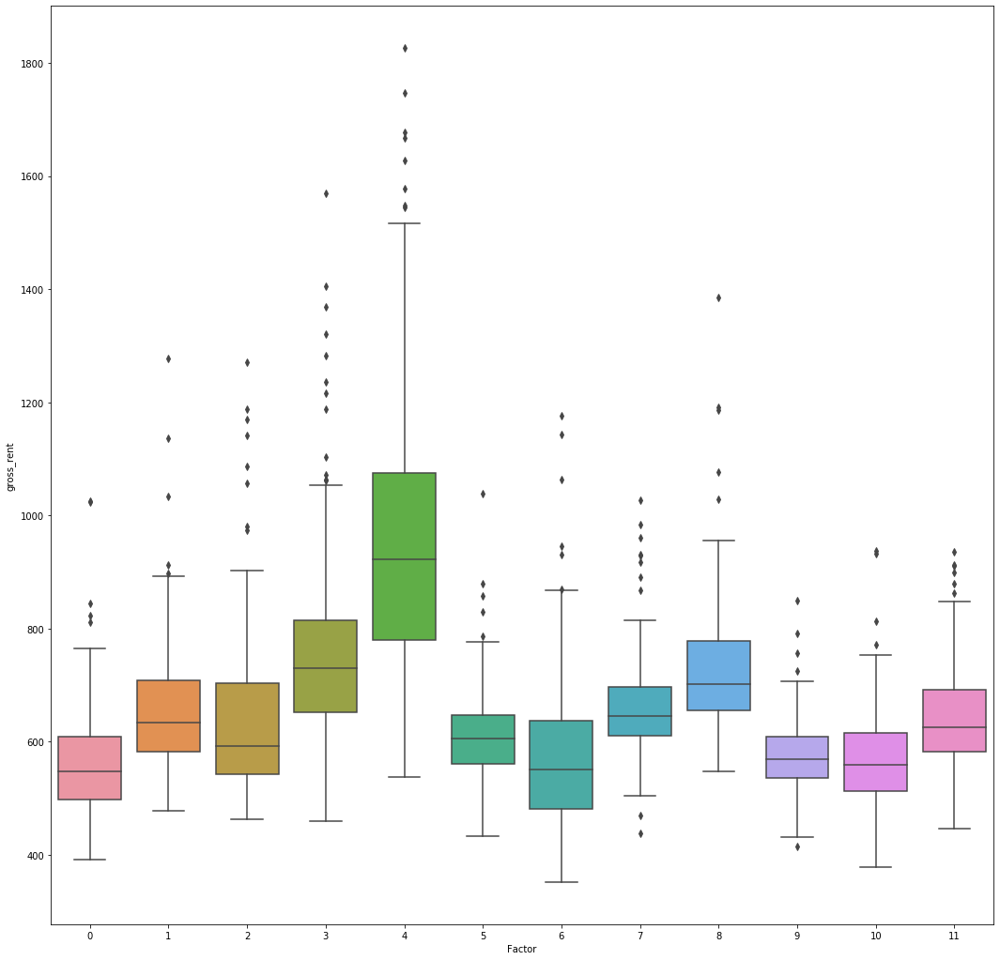

,Factor,Legend
0,3,Small-in a metro area with fewer than 1 millio...
1,4,Large-in a metro area with at least 1 million ...
2,5,Noncore adjacent to a small metro with town of...
3,1,Micropolitan not adjacent to a metro area
4,7,Micropolitan adjacent to a small metro area
5,0,Noncore adjacent to micro area and does not co...
6,10,Noncore adjacent to a small metro and does not...
7,9,Noncore adjacent to micro area and contains a ...
8,6,Noncore not adjacent to a metro/micro area and...
9,11,Noncore adjacent to a large metro area


In [0]:
generating_boxplot(categorical_columns_and_target,'urban_influence','gross_rent')

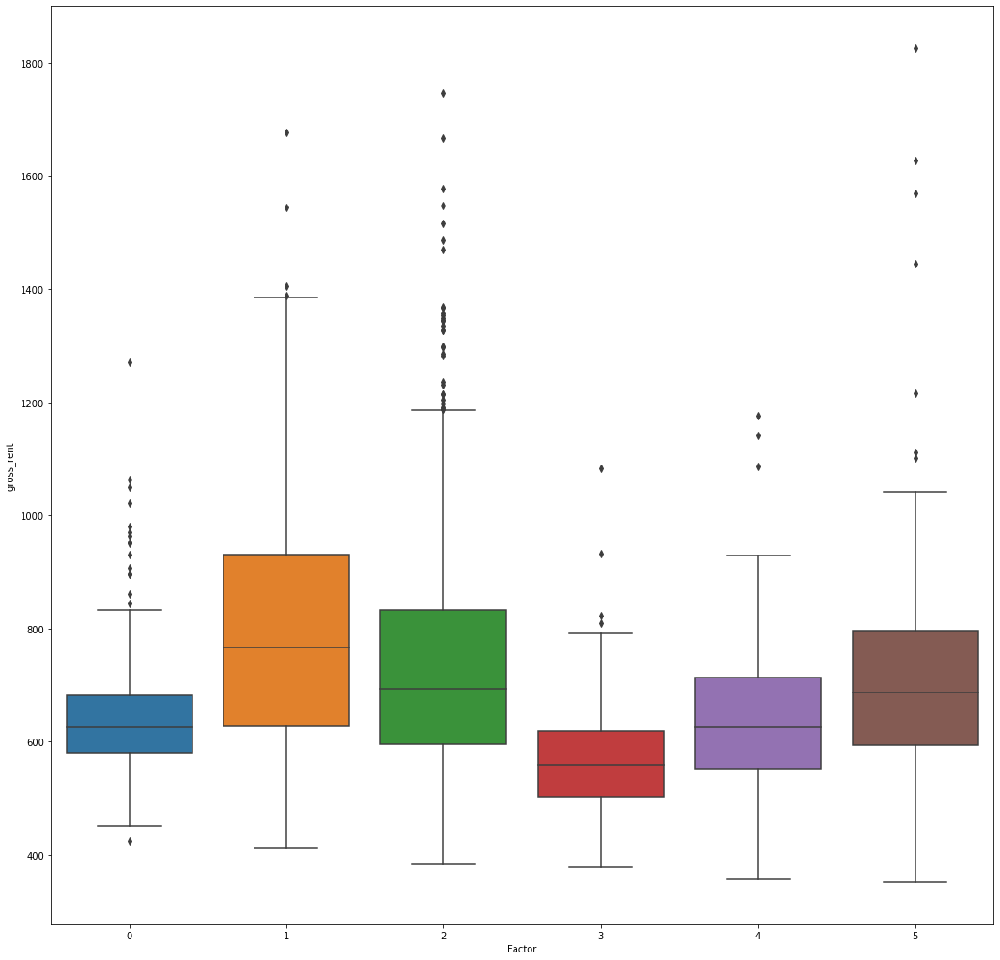

,Factor,Legend
0,2,Nonspecialized
1,0,Manufacturing-dependent
2,3,Farm-dependent
3,5,Federal/State government-dependent
4,1,Recreation
5,4,Mining-dependent


In [0]:
generating_boxplot(categorical_columns_and_target,'economic_typology','gross_rent')

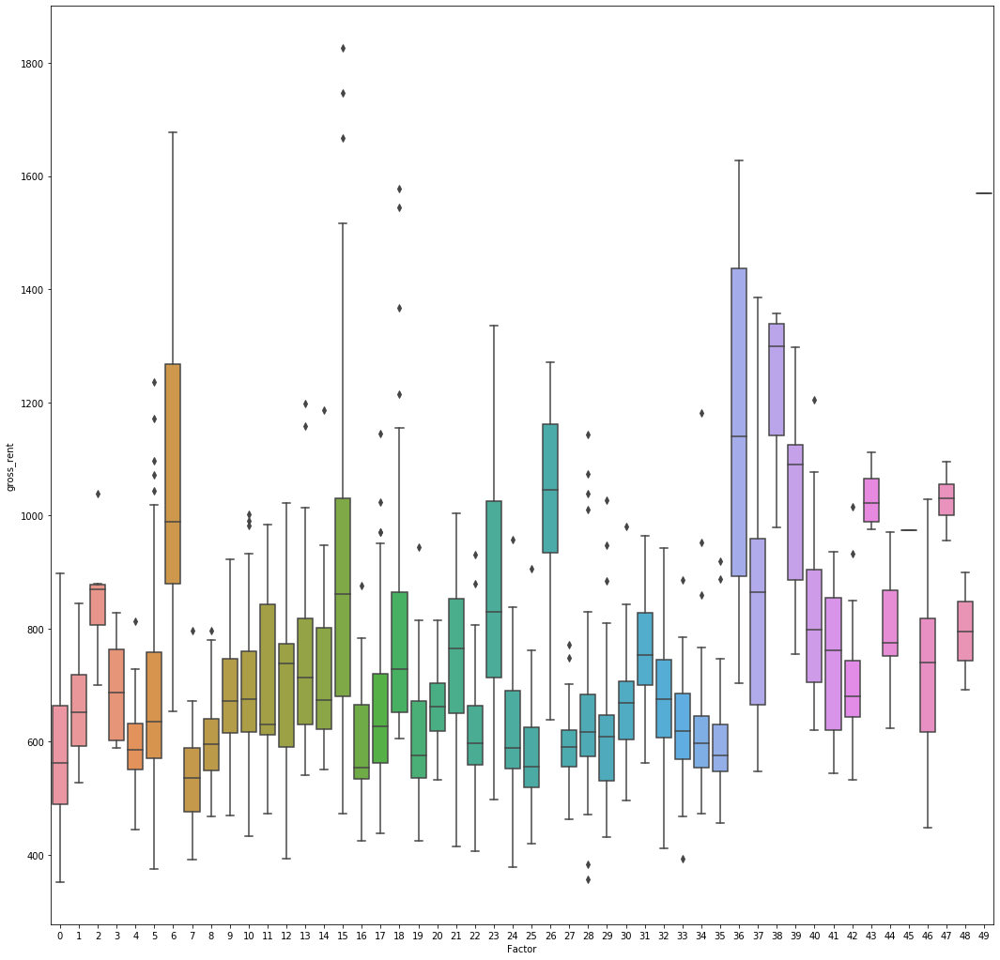

,Factor,Legend
0,10,1b0d913
1,5,4522abc
2,15,a952566
3,25,528ea9f
4,28,c479f0c
5,14,20d32fc
6,22,08f8fb4
7,29,dc9ae72
8,34,09d8cd0
9,42,9d1e27d


In [0]:
generating_boxplot(categorical_columns_and_target,'state','gross_rent')

# Feature Selection

In [0]:
train_values.dtypes

row_id                                          int64
county_code                                    object
state                                          object
population                                    float64
renter_occupied_households                    float64
pct_renter_occupied                           float64
evictions                                     float64
rent_burden                                   float64
pct_white                                     float64
pct_af_am                                     float64
pct_hispanic                                  float64
pct_am_ind                                    float64
pct_asian                                     float64
pct_nh_pi                                     float64
pct_multiple                                  float64
pct_other                                     float64
poverty_rate                                  float64
rucc                                           object
urban_influence             

In [0]:
num = (train_values.dtypes == float) | (train_values.dtypes == int)
num_cols = [i for i in num.index if num[i]]
num_cols = num_cols[1:]

In [0]:
obj = train_values.dtypes == object
obj_cols = [i for i in obj.index if obj[i]]

In [0]:
train_values[obj_cols[0]].value_counts()

d2ee4ab    1
6330c05    1
9f54aed    1
7942367    1
a6391df    1
          ..
4ce2f31    1
48fa503    1
f8b10a9    1
ee5cbdf    1
7647c5d    1
Name: county_code, Length: 1562, dtype: int64

In [6]:
obj_cols = obj_cols[1:]
obj_cols

['state', 'rucc', 'urban_influence', 'economic_typology']

In [0]:
label_encoder_cols = []
OH_cols = []
for i in range(len(obj_cols)):
    if train_values[obj_cols[i]].value_counts().shape[0] > 10:
        label_encoder_cols.append(obj_cols[i])
    else:
        OH_cols.append(obj_cols[i])

In [8]:
label_encoder_cols = label_encoder_cols[1:]
print(label_encoder_cols)
print(OH_cols)

['urban_influence']
['rucc', 'economic_typology']


In [0]:
num_cols.remove('rent_burden') #it could be a source of leaking 

In [0]:
obj_cols = ['urban_influence','rucc', 'economic_typology'] #State was deleted

# Separation of Train and Validation data

In [0]:
X = train_values[num_cols+obj_cols]
y = train_labels['gross_rent']

In [0]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y,train_size=0.80, test_size=0.20,random_state=1)

# Cleaning data and applying Feature Engineering

In [0]:
#Null values are filled and, label encoding an one encoding is used to used information of categorical features
def clean_data_pipeline(X_train,X_valid,num_cols,label_encoder_cols,OH_cols):
    numerical_transformer = SimpleImputer(strategy='mean')
    X_num_train = pd.DataFrame(numerical_transformer.fit_transform(X_train[num_cols]))
    X_num_train.columns = X_train[num_cols].columns
    le_imputer = SimpleImputer(strategy='most_frequent')
    le_encoder = LabelEncoder()
    X_le_train = pd.DataFrame(le_encoder.fit_transform(X_train[label_encoder_cols[0]].apply(lambda x: str(x))))
    X_le_train = pd.DataFrame(le_imputer.fit_transform(X_le_train))
    X_le_train.columns = label_encoder_cols
    OH_encoder = OneHotEncoder(handle_unknown='ignore',sparse=False)
    X_OH_train = pd.DataFrame(OH_encoder.fit_transform(X_train[OH_cols]))
    X_OH_train.columns = ['one-hot-encoded-feature-'+str(i) for i in range(len(list(X_OH_train.columns)))]
    X_train_new = pd.concat([X_num_train,X_le_train,X_OH_train],axis=1)
    X_num_valid = pd.DataFrame(numerical_transformer.transform(X_valid[num_cols]))
    X_num_valid.columns = X_valid[num_cols].columns
    X_le_valid = pd.DataFrame(le_encoder.transform(X_valid[label_encoder_cols[0]].apply(lambda x: str(x))))
    X_le_valid = pd.DataFrame(le_imputer.transform(X_le_valid))
    X_le_valid.columns = X_le_train.columns
    X_OH_valid = pd.DataFrame(OH_encoder.transform(X_valid[OH_cols]))
    X_OH_valid.columns = X_OH_train.columns
    X_valid_new = pd.concat([X_num_valid,X_le_valid,X_OH_valid],axis=1)
    return X_train_new,X_valid_new

In [0]:
X_train,X_valid = clean_data_pipeline(X_train,X_valid,num_cols,label_encoder_cols,OH_cols)

# Model Selection and fitting

In [0]:
model_1 = GBR()

In [0]:
model_1.fit(X_train,y_train)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [0]:
model_1.score(X_valid,y_valid)

0.8024658735045543

# Cross Validation

In [0]:
results = cross_validate(model_1,X_train,y_train,return_train_score=True,cv=7)
results

{'fit_time': array([0.97519064, 0.97071099, 0.96885395, 0.97032452, 0.97706246,
        0.96204615, 0.96475124]),
 'score_time': array([0.00182891, 0.00192308, 0.00187278, 0.00184059, 0.00184679,
        0.00179291, 0.00192404]),
 'test_score': array([0.73155959, 0.82788725, 0.82327971, 0.77720736, 0.75402441,
        0.78712791, 0.76161136]),
 'train_score': array([0.93453095, 0.92935913, 0.93230023, 0.92978847, 0.92599828,
        0.93215191, 0.93079201])}

# Validation Curve

In [0]:
n = np.arange(100,1000,50)
train_scores,test_scores = validation_curve(GBR(),
                                                X_train,
                                                y_train,
                                                param_name='n_estimators',
                                                param_range=n,
                                                cv=5)

<Figure size 1440x1440 with 0 Axes>

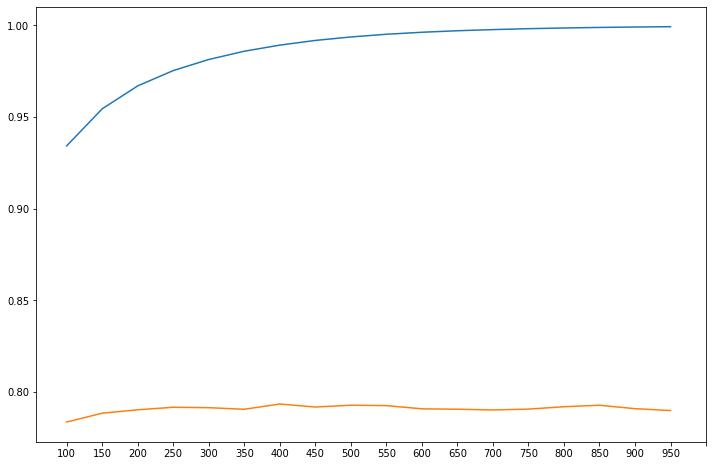

<Figure size 1440x1440 with 0 Axes>

In [0]:
plt.rcParams['figure.figsize']= [12,8]
plt.plot(np.mean(train_scores,axis=1))
plt.plot(np.mean(test_scores,axis=1))
plt.xticks(np.arange(19),n)
plt.figure(figsize=(20,20))
# A good values of n_estimators could be 300

# Learning curve

In [0]:
samples ,train, test = learning_curve(GBR(n_estimators=300),X_train,y_train,cv=5) 

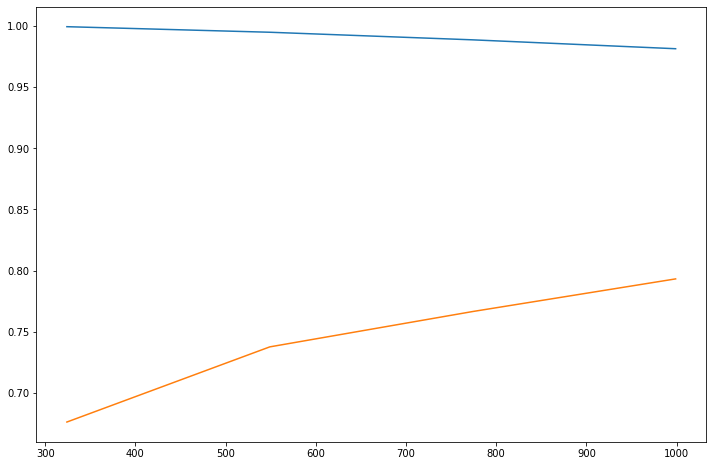

In [0]:
plt.rcParams['figure.figsize']= [12,8]
plt.plot(samples[1:],np.mean(train,axis=1)[1:])
plt.plot(samples[1:],np.mean(test,axis=1)[1:])
# the model is learning well from the given data

In [0]:
results = cross_validate(GBR(n_estimators=300),X_train,y_train,cv=5,scoring='r2',return_train_score=True)

In [0]:
results

{'fit_time': array([2.70551682, 2.60626054, 2.65200043, 2.6505456 , 2.67374086]),
 'score_time': array([0.00269055, 0.00312901, 0.0031085 , 0.00291514, 0.00266695]),
 'test_score': array([0.75767926, 0.84029645, 0.79431311, 0.77522699, 0.78745597]),
 'train_score': array([0.98271406, 0.98224238, 0.98185659, 0.9782573 , 0.98207359])}

# R2 score

In [0]:
model = GBR(n_estimators=300) # final model

In [16]:
model.fit(X_train,y_train)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=300,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [0]:
y_pred = model.predict(X_valid)

In [0]:
for i in range(len(y_pred)):
    y_pred[i] = int(y_pred[i])

In [19]:
r2_score(y_valid, y_pred)

0.8179954646323078

Text(0, 0.5, 'Actual Gross rent')

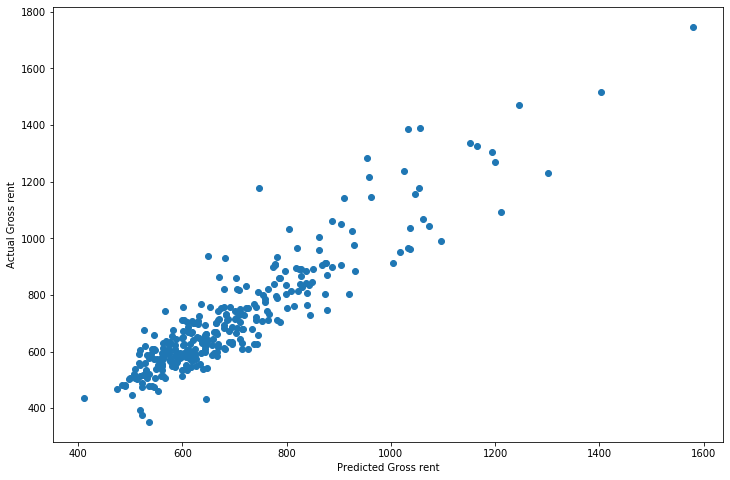

In [0]:
plt.rcParams['figure.figsize']= [12,8]
plt.scatter(y_pred,y_valid)
plt.xlabel('Predicted Gross rent')
plt.ylabel('Actual Gross rent')

# Machine Learning Explainability

## Permutation Importance

In [0]:
import eli5
from eli5.sklearn import PermutationImportance

In [0]:
permutations = PermutationImportance(model, random_state= 1).fit(X_valid, y_valid)

In [24]:
eli5.show_weights(permutations, feature_names= X_valid.columns.tolist())
# The most important features are Poverty_rate, pct_asian, population and pct_white
# because a varying of those features affects the model considerably

Weight,Feature
0.1249 ± 0.0219,poverty_rate
0.0639 ± 0.0093,pct_asian
0.0562 ± 0.0131,population
0.0542 ± 0.0177,pct_white
0.0504 ± 0.0056,pct_adults_bachelors_or_higher
0.0475 ± 0.0089,urban_influence
0.0400 ± 0.0088,pct_aged_65_years_and_older
0.0369 ± 0.0077,death_rate_per_1k
0.0237 ± 0.0032,pct_multiple
0.0179 ± 0.0037,pct_hispanic


## Partial Plots

In [0]:
from pdpbox import pdp, get_dataset, info_plots

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


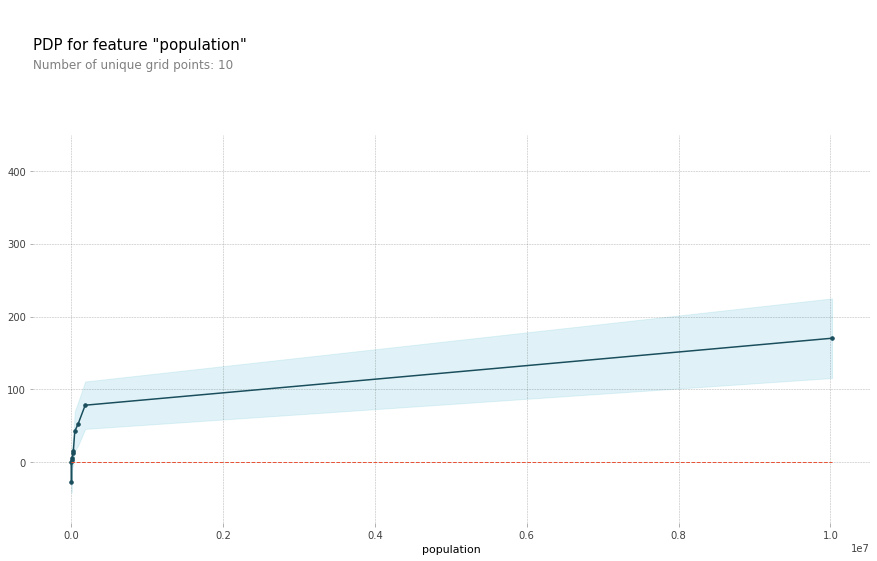

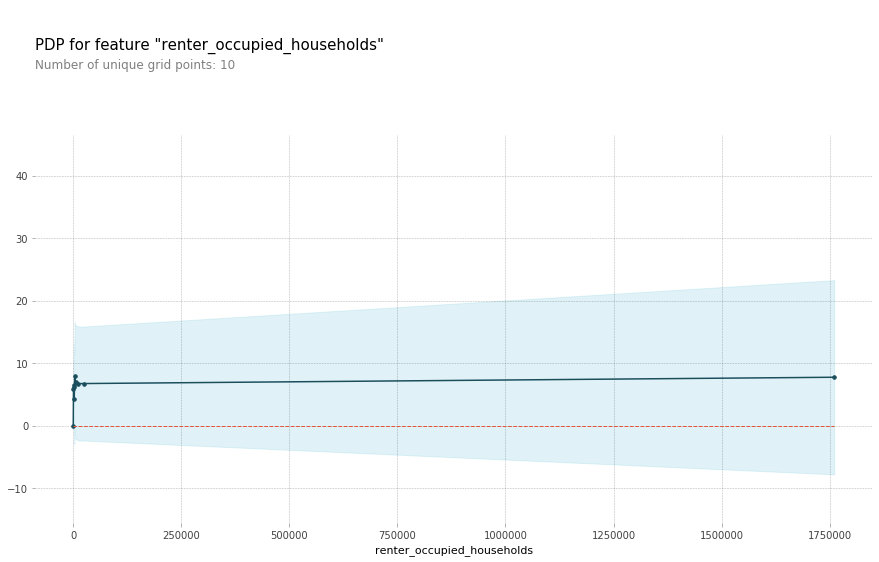

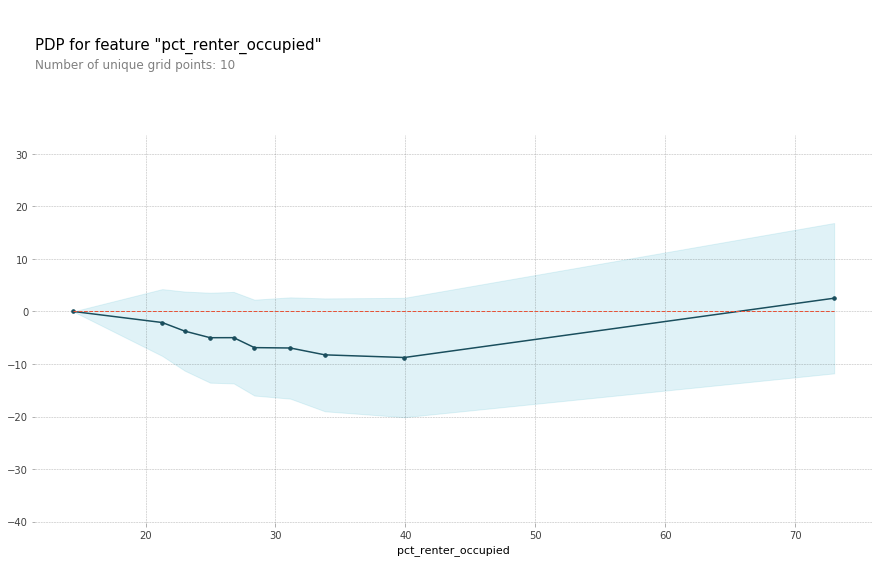

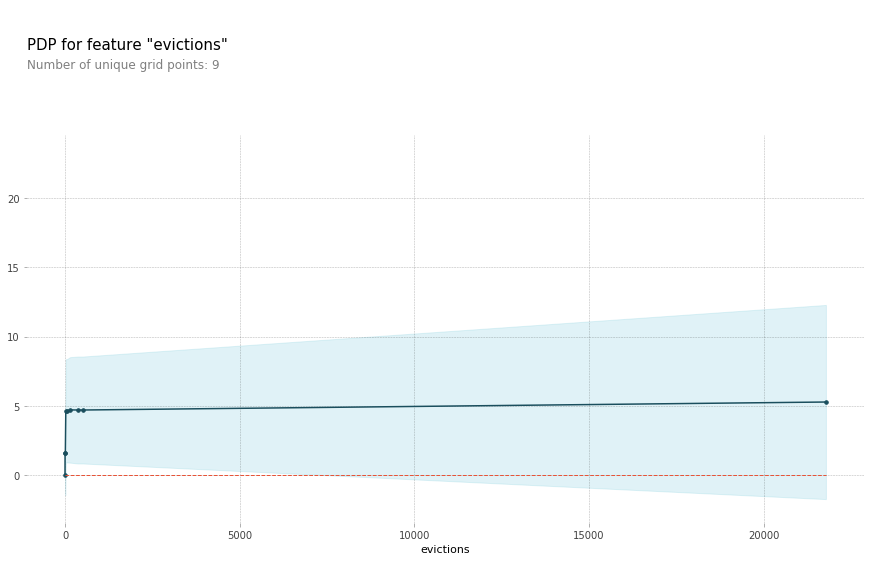

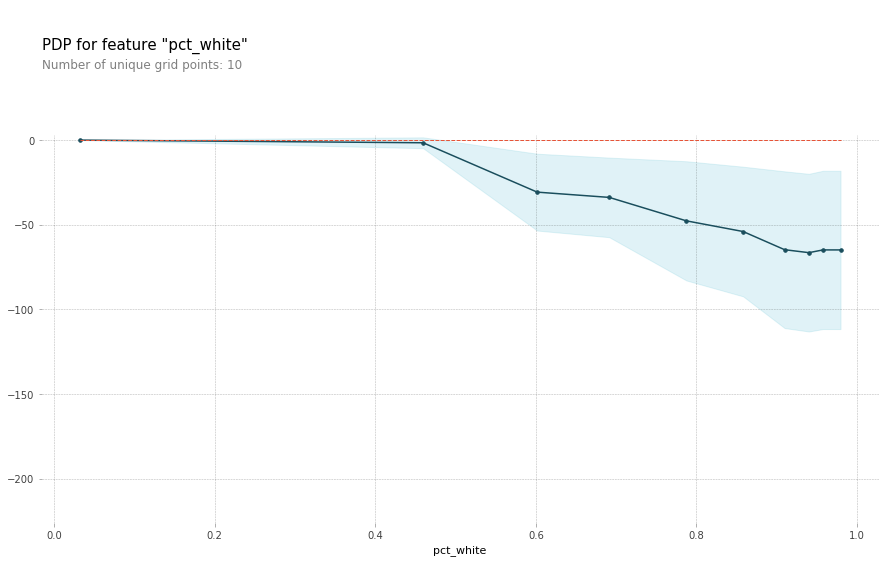

...

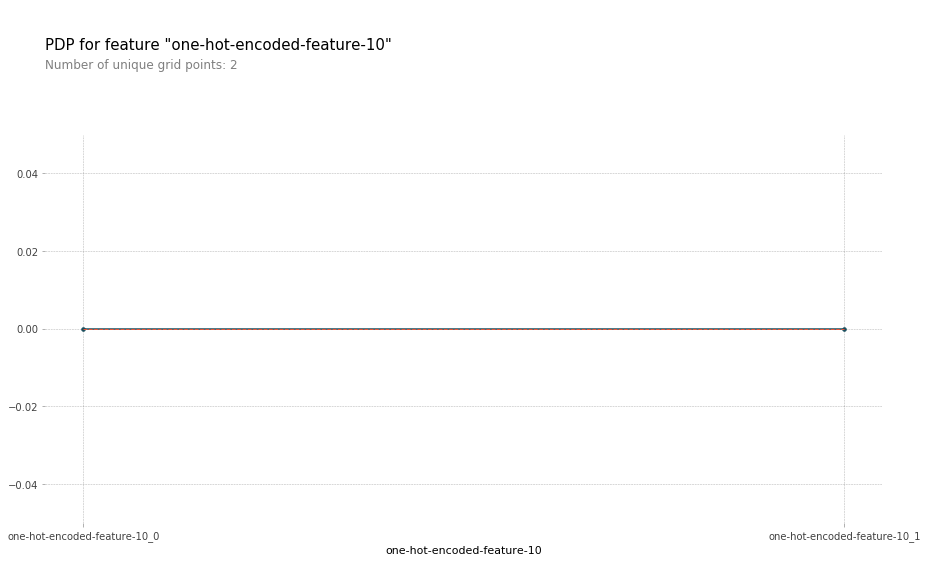

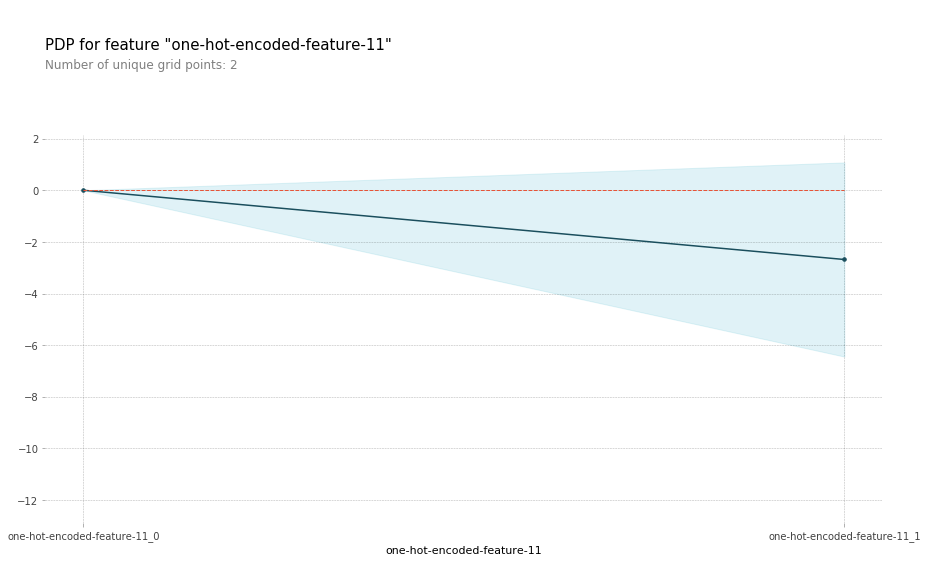

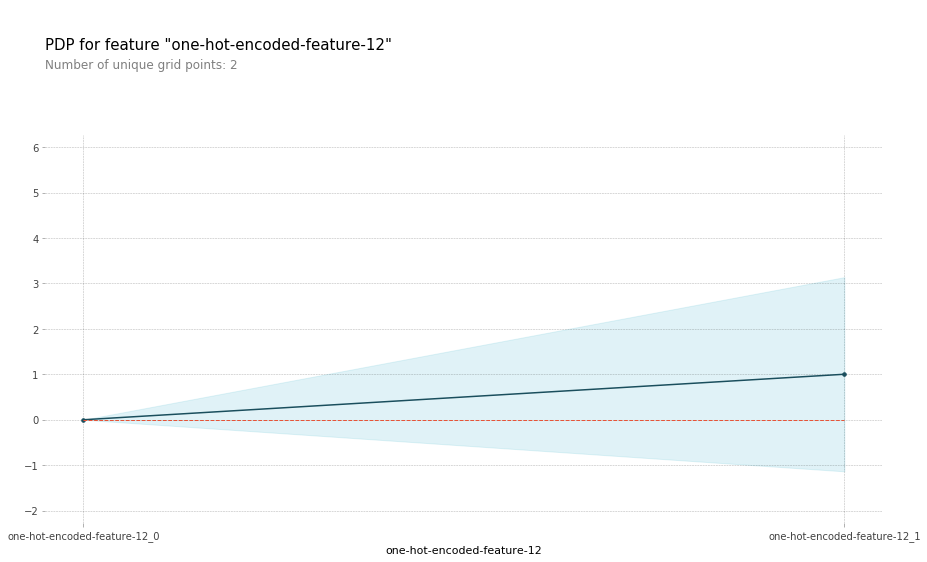

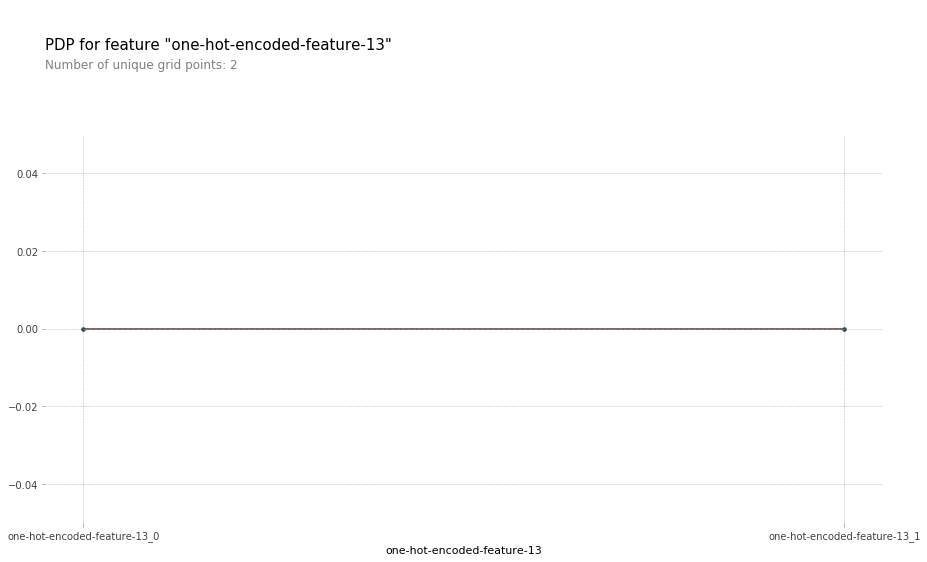

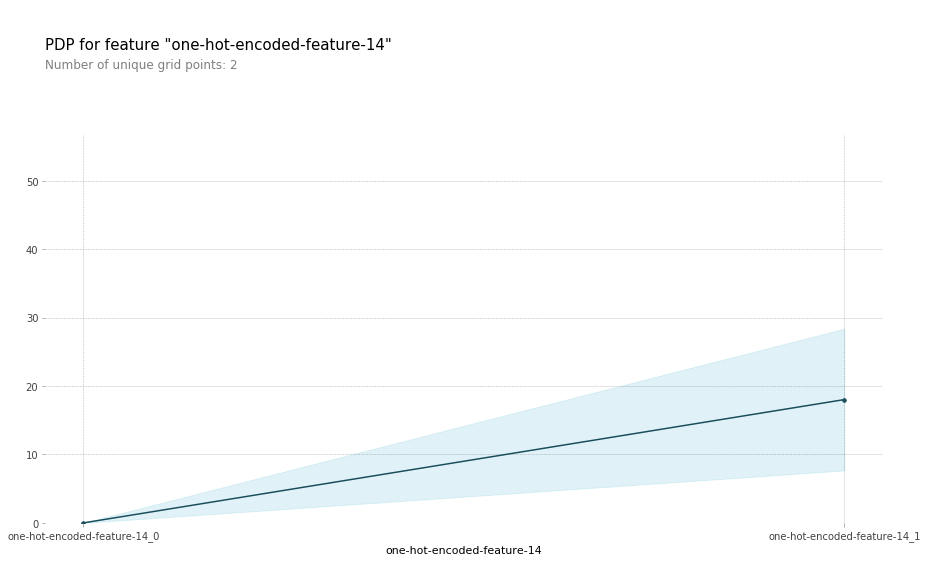

In [0]:
for i in X_valid.columns:
    pdp_feature = pdp.pdp_isolate(model=model, dataset=X_valid, model_features=X_valid.columns, feature=i)
    pdp.pdp_plot(pdp_feature, i)
    plt.show()
#here it can be seen how the value of a feature affect the gross rent

## SHAP values

In [0]:
import shap

In [27]:
explainer = shap.TreeExplainer(model)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.
The sklearn.ensemble.gradient_boosting module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part of the private API.


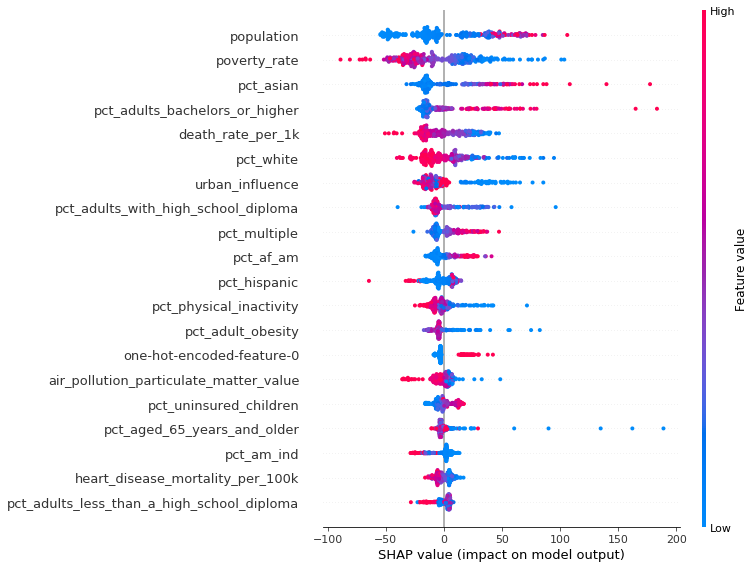

In [30]:
shap_values = explainer.shap_values(X_valid)

shap.summary_plot(shap_values, X_valid)
# Using the validation set it can be seen how the values of the mix of feature has an effect on the gross_rent